# Result Visualizer

Different visualizations of anomaly detection result, including forecasts, reconstructions, anomaly scores, predicted and actual anomalies

In [2]:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    !pip install cufflinks more-itertools nbformat

  Using cached cufflinks-0.17.3-py3-none-any.whl
  Using cached nbformat-5.9.2-py3-none-any.whl (77 kB)
  Using cached colorlover-0.3.0-py3-none-any.whl (8.9 kB)
  Using cached ipywidgets-8.1.1-py3-none-any.whl (139 kB)
  Using cached fastjsonschema-2.19.1-py3-none-any.whl (23 kB)
  Using cached widgetsnbextension-4.0.9-py3-none-any.whl (2.3 MB)
  Using cached jupyterlab_widgets-3.0.9-py3-none-any.whl (214 kB)


In [3]:
!pip install ipykernel

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import os
import pickle
from sklearn.metrics import f1_score, precision_score, recall_score
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode
import plotly.graph_objs as go
import cufflinks as cf
import glob
import sys
import json
import more_itertools as mit
from tqdm.notebook import tqdm
cf.go_offline()
init_notebook_mode

sys.path.insert(0, '.')
from plotting import Plotter

In [27]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

/tmp/ipykernel_135/1226147920.py:1: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



### Provide what output to visualize
In case of multiple models trained for the same dataset, they will be saved in different folders named using the datetime of training.
Use 'model_id' to specify which to load, '-1' for latest, '-2' for second latest, etc, or you can specify the exact datetime. 

In [28]:
#res_path = './output/MSL'
#res_path = './output/SMAP'
#res_path = './output/SMD/1-1'
# res_path = './output/SWAT'
#res_path = './output/SKAB'
#res_path = './output/WADI'
#res_path = './output/ACT'
#res_path = './output/METRO'
res_path = './output/IVECO'

In [34]:
plotter = Plotter(res_path, model_id='-1')
plotter.result_summary()

Loading results of ./output/IVECO/16012024_164609
Result summary:
Epsilon:
		precision: 0.00, recall: 0.00, F1: 0.00
POT:
		precision: 0.00, recall: 0.00, F1: 0.00
Brute-Force:
		precision: 0.00, recall: 1.00, F1: 0.00


/root/mtad-gat-pytorch/./plotting.py:58: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/mtad-gat-pytorch/./plotting.py:34: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/root/mtad-gat-pytorch/./plotting.py:35: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



## Interactive plot 
- Interactive plot of forecastings, reconstructions,actual values, errors, etc of the specified feature.
- Params:
    - ```feature```: which feature to visualize
    - ```plot_train```: whether to also plot for train set
    - ```plot_errors```: whether to plot anomaly scores (error) for the feature
    - ```plot_feature_anom```: if True, the feature-wise threshold and anomaly prediction is included
    - ```start```: start index of dataset
    - ```end```: end index of dataset

If ```plot_feature_anom``` is set to True:
- Predicted anomalies (for the particular feature) are visualized by a light blue rectangle.
- As we only predict one feature for SMAP and MSL, the actual (true) anomalies are included using a red rectangle, making correctly predicted anomalies purple.


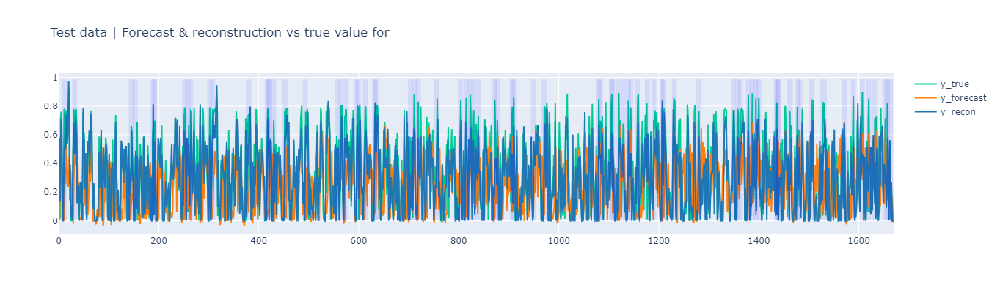

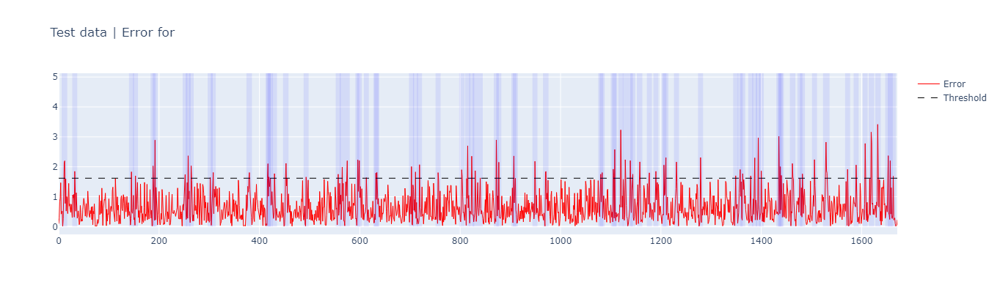

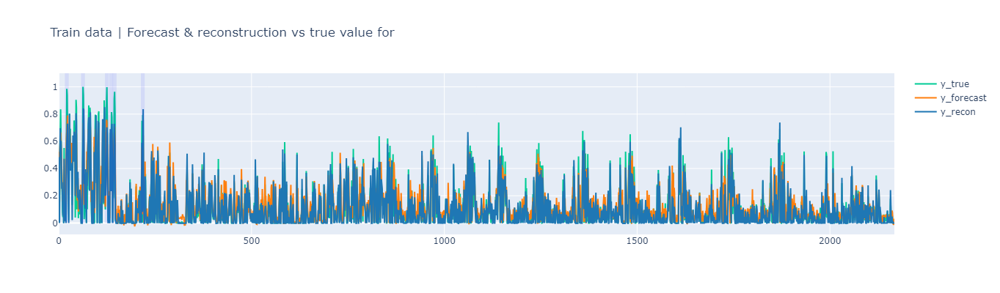

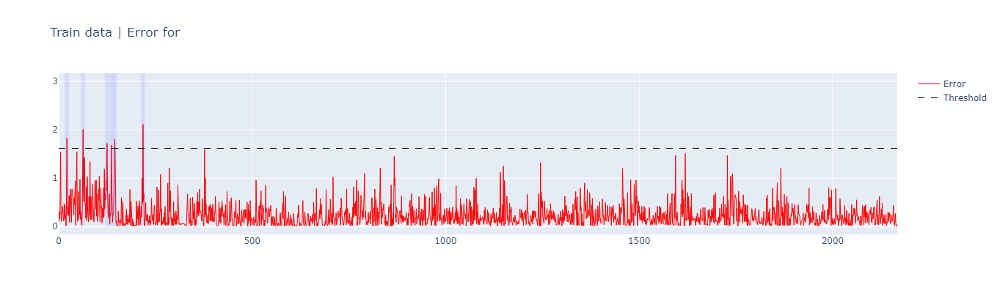

In [35]:
plotter.plot_feature(
    feature=2, 
    plot_train=True, 
    plot_errors=True, 
    plot_feature_anom=True,
    #start=350, 
    #end=3000
)

### Global (entity-level) Anomaly Predictions 
```plot_global_predictions``` and ```plotly_global_predictions``` visualize the entity-level anomaly scores which are used to make anomaly predictions at entity-level.
In ```plotly_global_predictions```:
- Actual (true) anomalies are visualized by a red rectangle
- Predicted anomalies are visualized by a blue rectangle. 
- Thus, if anomalies are predicted correctly the color of the rectangle will be purple. 

In [36]:
if 'IVECO' in res_path:
    chassis_path = 'datasets\data\processed\IVECO_test_chassis.pkl'
    with open(chassis_path, 'rb') as file:
        chassis = pickle.load(file)
    plotter.plot_global_predictions_iveco(type="test", pca = True, plot_chassis=True, chassis=chassis)



FileNotFoundError: [Errno 2] No such file or directory: 'datasets\\data\\processed\\IVECO_test_chassis.pkl'

In [37]:
plotter.plot_global_predictions(type="test", pca = True, pca_n_features = 20)


In [8]:
False*5


0

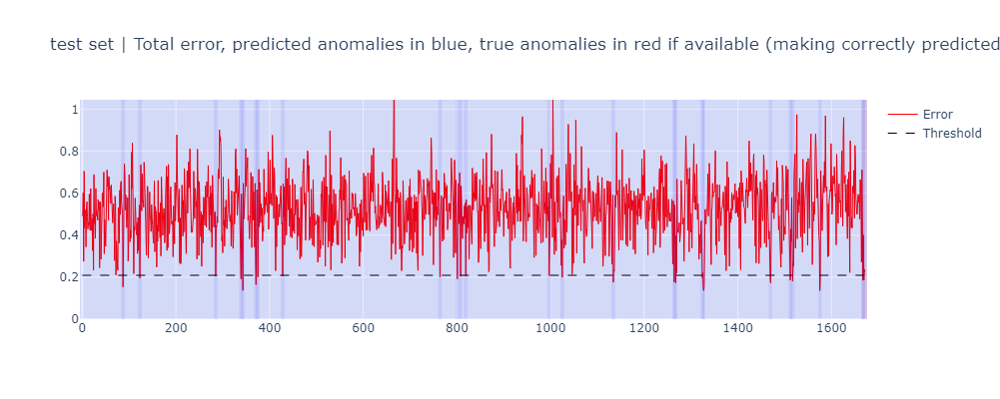

In [17]:
plotter.plotly_global_predictions(type="test")

In [ ]:
# plotter.plot_all_features(type='test')